In [71]:
!pip install pycaret

In [72]:
!pip install pycaret[analysis]

In [73]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [74]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  2.1.4
Seaborn version:  0.13.2


In [77]:
df = pd.read_csv('https://raw.githubusercontent.com/IyasLa/INSE6220/refs/heads/main/riceClassification.csv?token=GHSAT0AAAAAADCQCD5FTL7PML5EAAVW2UVO2AFONLQ')
df.head(25)

,id,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,1,4537,92.229316,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796,1
1,2,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137,1
2,3,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950,1
3,4,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456,1
4,5,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000,1
5,6,2990,77.417073,50.954344,0.752861,3080,61.700780,0.584898,216.930,0.798439,1.519342,1
6,7,3556,84.323564,55.413061,0.753762,3636,67.287739,0.750211,227.007,0.867148,1.521727,1
7,8,3788,86.952411,56.444769,0.760664,3866,69.448048,0.800676,235.476,0.858473,1.540487,1
8,9,2629,74.133114,48.074144,0.761228,2790,57.856260,0.640595,207.325,0.768594,1.542058,1
9,10,5719,106.721142,68.977700,0.763053,5819,85.332625,0.754983,281.839,0.904748,1.547183,1


We will be dropping the ID column since it will not be relevant to our process

In [78]:
df = df.drop('id', axis=1)
df.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,4537,92.229316,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796,1
1,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137,1
2,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950,1
3,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456,1
4,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000,1
5,2990,77.417073,50.954344,0.752861,3080,61.700780,0.584898,216.930,0.798439,1.519342,1
6,3556,84.323564,55.413061,0.753762,3636,67.287739,0.750211,227.007,0.867148,1.521727,1
7,3788,86.952411,56.444769,0.760664,3866,69.448048,0.800676,235.476,0.858473,1.540487,1
8,2629,74.133114,48.074144,0.761228,2790,57.856260,0.640595,207.325,0.768594,1.542058,1
9,5719,106.721142,68.977700,0.763053,5819,85.332625,0.754983,281.839,0.904748,1.547183,1


In [79]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [80]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


Plotting the correlation between our variables according to our 'Class' using sns.airplot

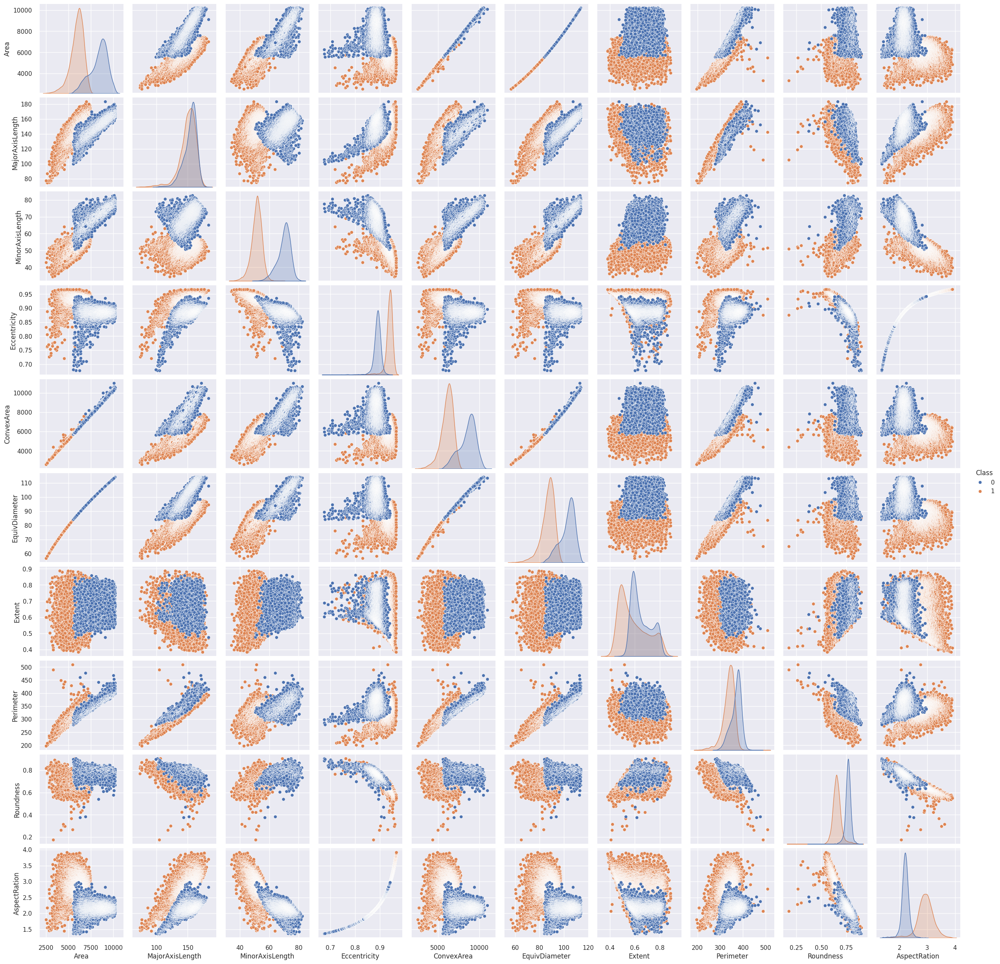

In [81]:
sns.pairplot(df, hue='Class')
plt.show()

Defining our y-axis which in this case will be 'Class' and also drawing the pie chart showcasing the frequency of each class


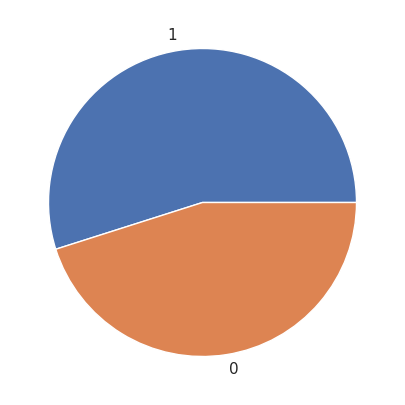

In [82]:
y =df['Class']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

In [83]:
X = df.drop(columns=['Class'])
X.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation
0,4537,92.229316,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796
1,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137
2,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950
3,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456
4,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000
5,2990,77.417073,50.954344,0.752861,3080,61.700780,0.584898,216.930,0.798439,1.519342
6,3556,84.323564,55.413061,0.753762,3636,67.287739,0.750211,227.007,0.867148,1.521727
7,3788,86.952411,56.444769,0.760664,3866,69.448048,0.800676,235.476,0.858473,1.540487
8,2629,74.133114,48.074144,0.761228,2790,57.856260,0.640595,207.325,0.768594,1.542058
9,5719,106.721142,68.977700,0.763053,5819,85.332625,0.754983,281.839,0.904748,1.547183


Summarizing our data (mean, std, first quartile, second quartile, third quartile..)

In [84]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,18185.0,7036.492989,1467.197150,2522.000000,5962.000000,6660.000000,8423.000000,10210.000000
MajorAxisLength,18185.0,151.680754,12.376402,74.133114,145.675910,153.883750,160.056214,183.211434
MinorAxisLength,18185.0,59.807851,10.061653,34.409894,51.393151,55.724288,70.156593,82.550762
Eccentricity,18185.0,0.915406,0.030575,0.676647,0.891617,0.923259,0.941372,0.966774
ConvexArea,18185.0,7225.817872,1502.006571,2579.000000,6125.000000,6843.000000,8645.000000,11008.000000
EquivDiameter,18185.0,94.132952,9.906250,56.666658,87.126656,92.085696,103.559146,114.016559
Extent,18185.0,0.616653,0.104389,0.383239,0.538530,0.601194,0.695664,0.886573
Perimeter,18185.0,351.606949,29.500620,197.015000,333.990000,353.088000,373.003000,508.511000
Roundness,18185.0,0.707998,0.067310,0.174590,0.650962,0.701941,0.769280,0.904748
AspectRation,18185.0,2.599081,0.434836,1.358128,2.208527,2.602966,2.964101,3.911845


First step: Standarization

In [85]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation
0,-1.703630,-4.803744,0.417927,-6.393938,-1.696989,-1.830049,0.391654,-2.661778,0.839588,-2.663800
1,-2.838478,-6.220789,-0.835611,-6.209583,-2.803539,-3.398143,0.923070,-4.857318,1.837215,-2.635418
2,-2.718519,-6.091404,-0.771700,-6.024520,-2.725641,-3.213879,1.365122,-4.799860,2.383587,-2.605950
3,-2.701479,-6.031573,-0.783130,-5.781578,-2.708996,-3.188141,1.598635,-4.777995,2.409877,-2.565690
4,-2.278893,-5.377799,-0.341288,-5.433479,-2.279559,-2.580390,1.463045,-4.111042,2.477331,-2.504645
5,-2.758051,-6.000590,-0.879950,-5.316410,-2.760262,-3.274000,-0.304202,-4.565350,1.343680,-2.483161
6,-2.372271,-5.442538,-0.436798,-5.286951,-2.390080,-2.710001,1.279457,-4.223754,2.364484,-2.477675
7,-2.214142,-5.230124,-0.334257,-5.061184,-2.236948,-2.491920,1.762905,-3.936668,2.235600,-2.434533
8,-3.004105,-6.265938,-1.166213,-5.042738,-2.953342,-3.662101,0.229356,-4.890945,0.900273,-2.430919
9,-0.897991,-3.632788,0.911391,-4.983052,-0.936651,-0.888385,1.325177,-2.365031,2.923116,-2.419132


In [86]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,18185.0,7.502018e-17,1.000027,-3.077035,-0.732364,-0.256614,0.945030,2.163032
MajorAxisLength,18185.0,-1.750471e-15,1.000027,-6.265938,-0.485198,0.178005,0.676747,2.547715
MinorAxisLength,18185.0,-3.876043e-16,1.000027,-2.524303,-0.836337,-0.405865,1.028561,2.260418
Eccentricity,18185.0,-1.369118e-15,1.000027,-7.809152,-0.778086,0.256851,0.849263,1.680082
ConvexArea,18185.0,1.875505e-16,1.000027,-3.093825,-0.732918,-0.254878,0.944883,2.518156
EquivDiameter,18185.0,1.487900e-15,1.000027,-3.782190,-0.707280,-0.206669,0.951566,2.007233
Extent,18185.0,-7.658310e-16,1.000027,-2.236051,-0.748401,-0.148095,0.756913,2.585776
Perimeter,18185.0,-1.137806e-15,1.000027,-5.240439,-0.597189,0.050205,0.725295,5.318816
Roundness,18185.0,2.813257e-16,1.000027,-7.924849,-0.847385,-0.089998,0.910465,2.923116
AspectRation,18185.0,-1.750471e-16,1.000027,-2.853917,-0.898188,0.008934,0.839464,3.019065


In [87]:
observations = list(df.index)
variables = list(df.columns)

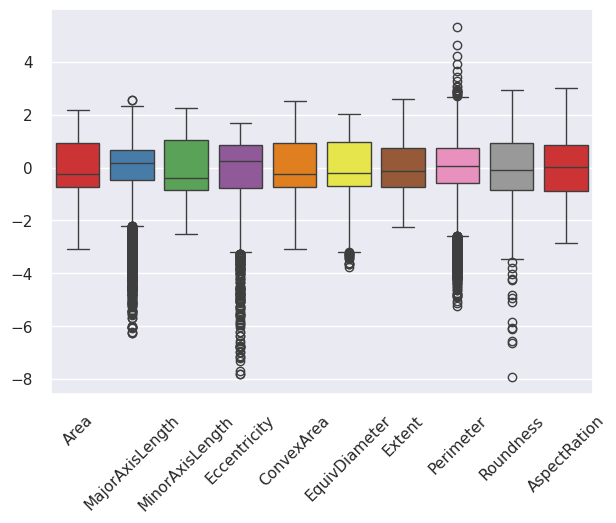

In [88]:
ax = plt.figure()
ax = sns.boxplot(data=X, orient="v", palette="Set1")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

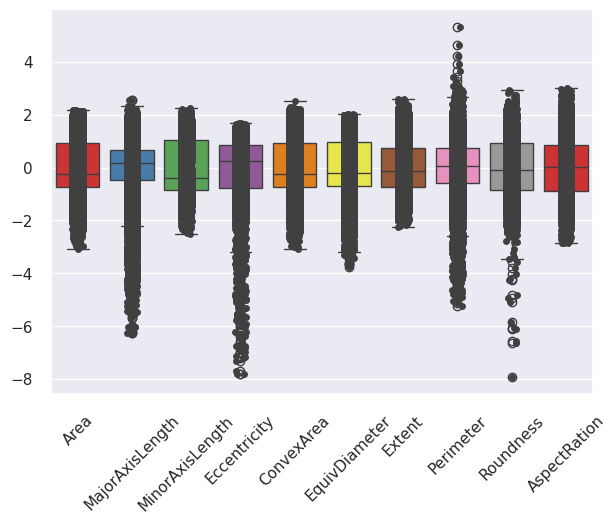

In [89]:
ax = plt.figure()
ax = sns.boxplot(data=X, orient="v", palette="Set1")
ax = sns.stripplot(data=X, color=".25")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

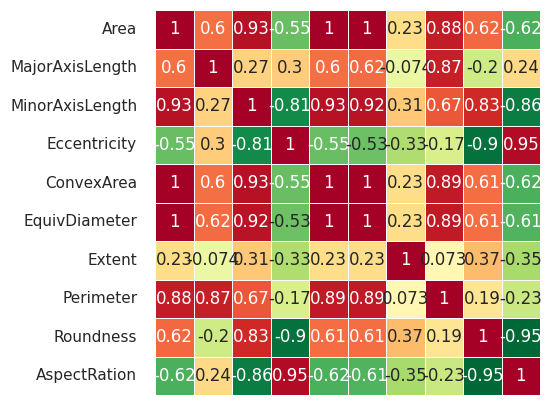

In [90]:
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.5, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=False)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

Text(0, 0.5, '$Z_2$')

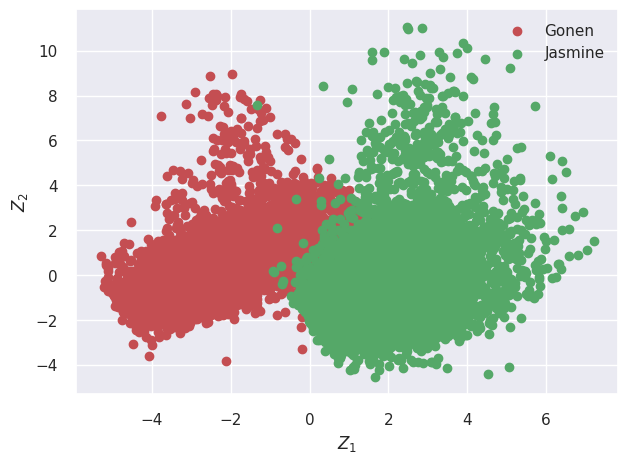

In [91]:
pca = PCA()
Z = pca.fit_transform(X)

idx_Gonen = np.where(y == 0)
idx_Jasmine = np.where(y == 1)

plt. figure()
plt.scatter(Z[idx_Gonen,0], Z[idx_Gonen,1], c='r', label='Gonen')
plt.scatter(Z[idx_Jasmine,0], Z[idx_Jasmine,1], c='g', label='Jasmine')
plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

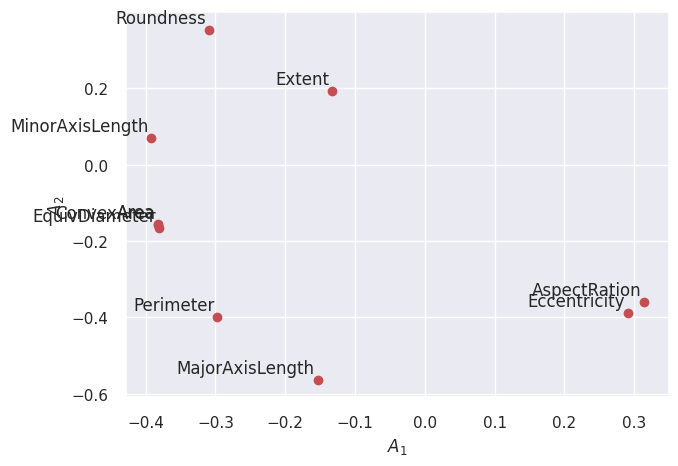

In [92]:
A = pca.components_.T

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')

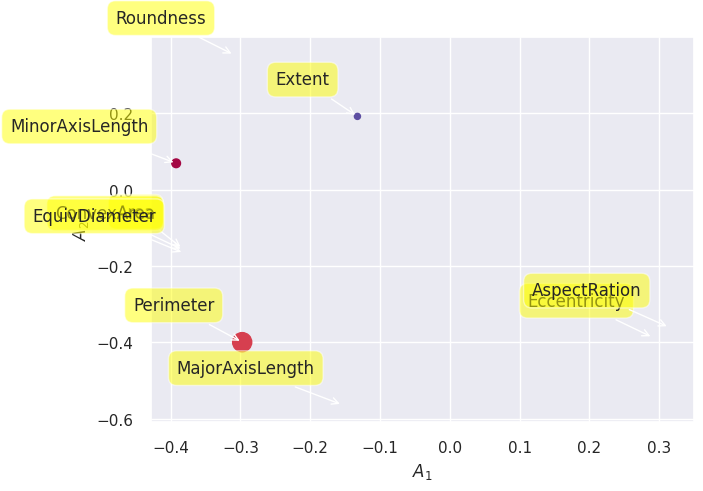

In [93]:
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

Text(0, 0.5, 'Explained variance')

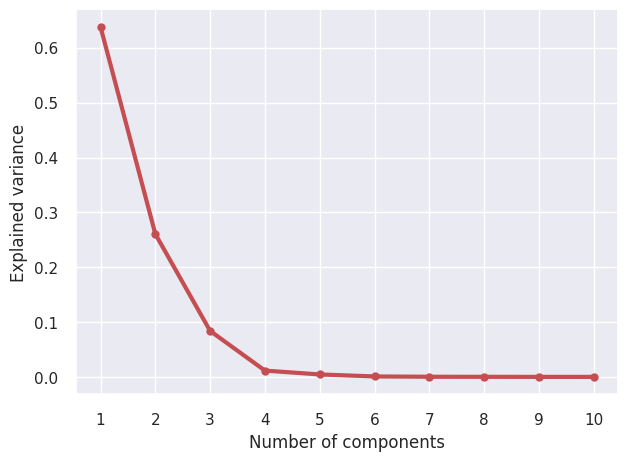

In [94]:

Lambda = pca.explained_variance_
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')

Text(0, 0.5, 'Cumulative explained variance')

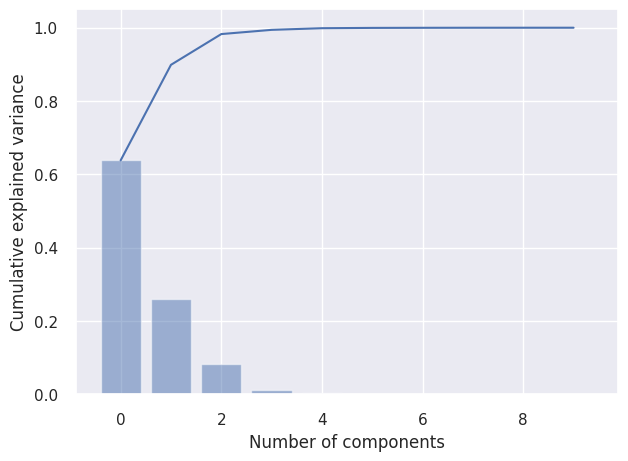

In [95]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

In [96]:
PC_variance = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(ell * 100)
}
PC_variance

{'0': 'PC 1 (63.8%)',
 '1': 'PC 2 (26.1%)',
 '2': 'PC 3 (8.4%)',
 '3': 'PC 4 (1.1%)',
 '4': 'PC 5 (0.4%)',
 '5': 'PC 6 (0.1%)',
 '6': 'PC 7 (0.0%)',
 '7': 'PC 8 (0.0%)',
 '8': 'PC 9 (0.0%)',
 '9': 'PC 10 (0.0%)'}

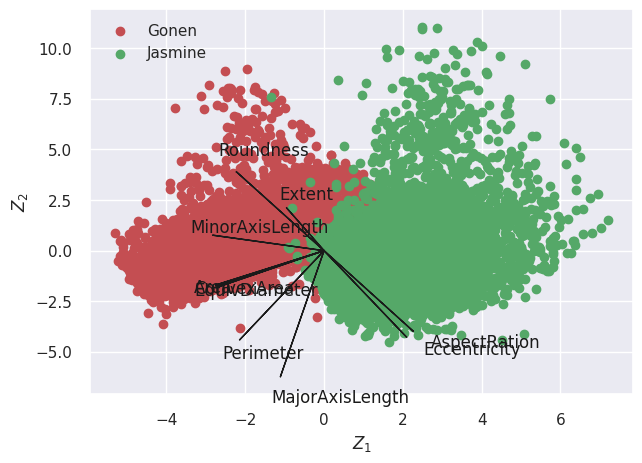

In [97]:
A1 = A[:,0]
A2 = A[:,1]
Z1 = Z[:,0]
Z2 = Z[:,1]

plt.figure()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
plt.scatter(Z[idx_Gonen,0], Z[idx_Gonen,1], c='r', label='Gonen')
plt.scatter(Z[idx_Jasmine,0], Z[idx_Jasmine,1], c='g', label='Jasmine')
plt.legend(loc='upper left')
for i in range(len(A1)):
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')


In [98]:
!pip install pca

In [99]:
from pca import pca
model = pca(n_components=0.89)
out = model.fit_transform(X)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [89.0%] explained variance using the [10] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [2] that covers the [89.00%] explained variance.
[pca] >The PCA reduction is performed on the [10] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


In [100]:
out['PC']

,PC1,PC2
0,0.354083,8.442447
1,2.854920,11.013745
2,2.482805,11.056600
3,2.493232,10.949386
4,1.581389,9.952350
...,...,...
18180,2.294296,-0.298537
18181,-0.224148,-2.334744
18182,1.488253,-0.662739
18183,2.203078,-0.804845


[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '2 Principal Components explain [98.26%] of the variance'}, xlabel='PC1 (63.8% expl.var)', ylabel='PC2 (26.0% expl.var)'>)

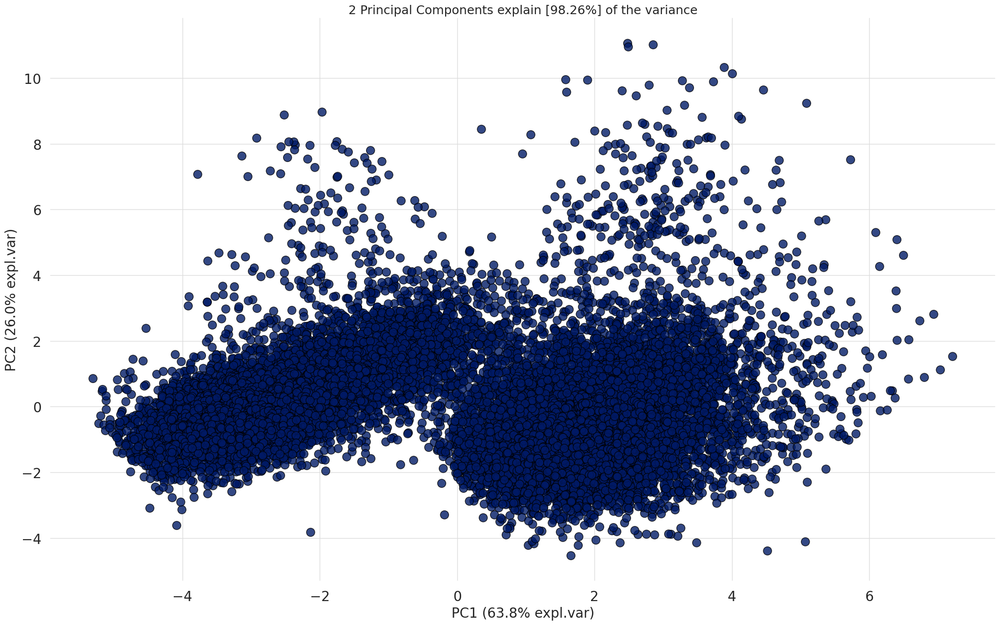

In [101]:
model.scatter(label=True, legend=False)

In [102]:
A = out['loadings'].T

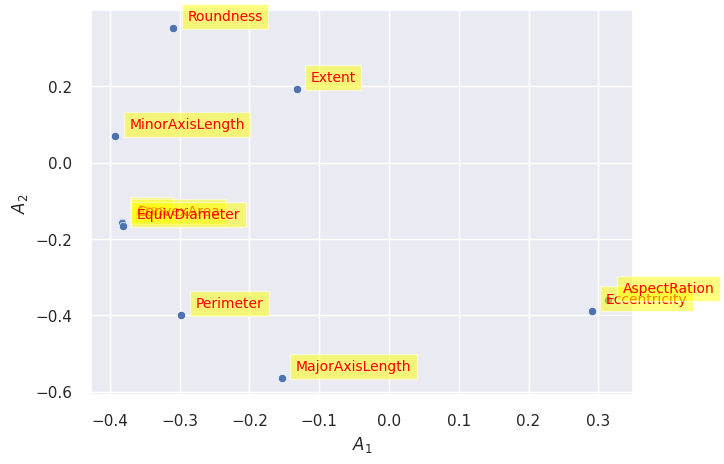

In [103]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

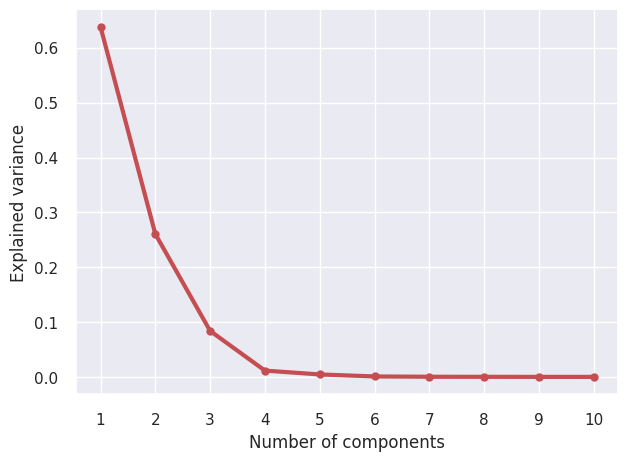

In [104]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()

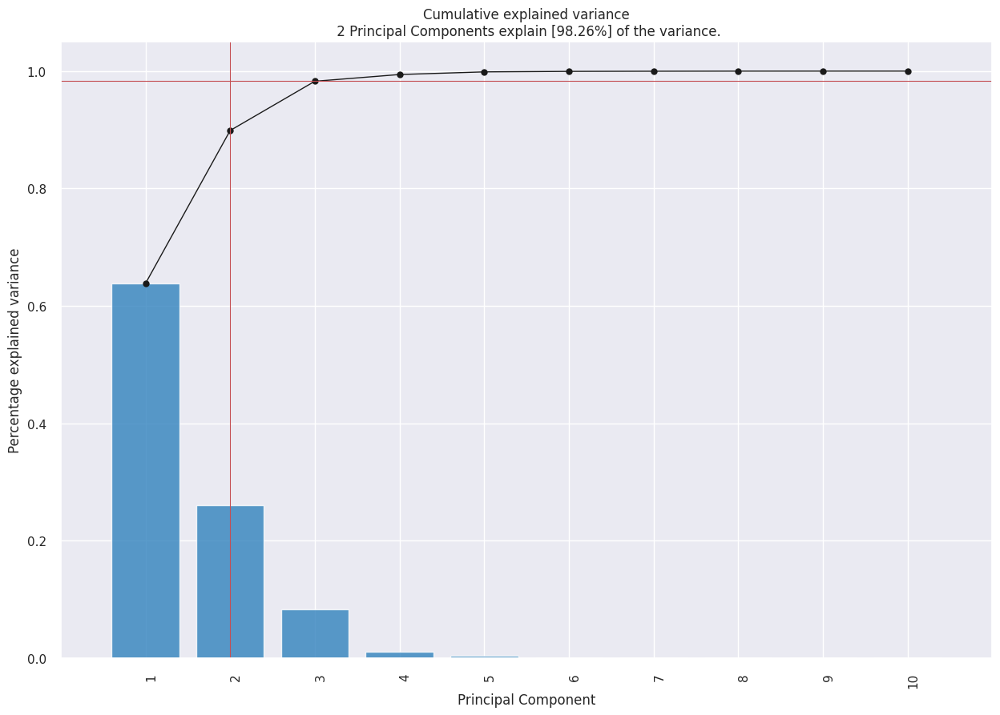

In [105]:
model.plot();

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.
[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '2 Principal Components explain [98.26%] of the variance'}, xlabel='PC1 (63.8% expl.var)', ylabel='PC2 (26.0% expl.var)'>)

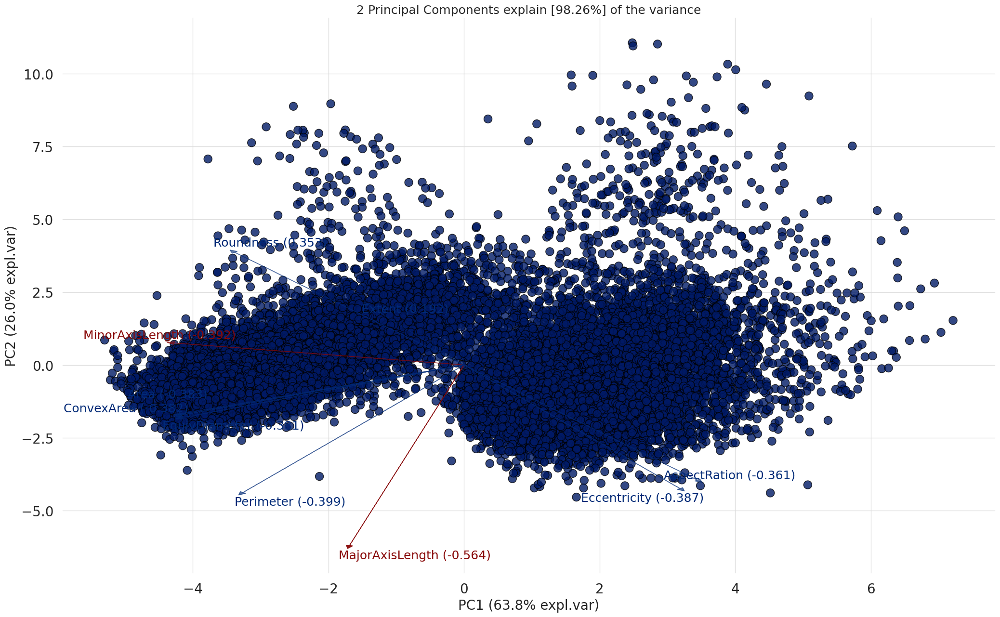

In [106]:
model.biplot(label=False, legend=False)

In [107]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (16366, 11)
Unseen Data For Predictions: (1819, 11)


In [108]:
from pycaret.classification import *
clf = setup(data=data, target='Class', train_size=0.7, session_id=123)

,Description,Value
0,Session id,123
1,Target,Class
2,Target type,Binary
3,Original data shape,"(16366, 11)"
4,Transformed data shape,"(16366, 11)"
5,Transformed train set shape,"(11456, 11)"
6,Transformed test set shape,"(4910, 11)"
7,Numeric features,10
8,Preprocess,True
9,Imputation type,simple


In [109]:
 best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9896,0.9988,0.9932,0.9880,0.9905,0.9790,0.9790,1.9260
rf,Random Forest Classifier,0.9895,0.9979,0.9925,0.9884,0.9905,0.9788,0.9789,2.1160
qda,Quadratic Discriminant Analysis,0.9892,0.9986,0.9936,0.9867,0.9902,0.9781,0.9782,0.0360
ada,Ada Boost Classifier,0.9890,0.9987,0.9917,0.9883,0.9900,0.9778,0.9778,0.9550
et,Extra Trees Classifier,0.9890,0.9980,0.9914,0.9886,0.9900,0.9778,0.9778,0.4180
xgboost,Extreme Gradient Boosting,0.9890,0.9984,0.9922,0.9878,0.9900,0.9778,0.9778,0.2040
lightgbm,Light Gradient Boosting Machine,0.9889,0.9989,0.9916,0.9883,0.9899,0.9776,0.9776,0.9180
gbc,Gradient Boosting Classifier,0.9888,0.9983,0.9924,0.9873,0.9898,0.9774,0.9775,3.8800
ridge,Ridge Classifier,0.9877,0.9989,0.9971,0.9807,0.9889,0.9751,0.9753,0.0590
lda,Linear Discriminant Analysis,0.9873,0.9988,0.9963,0.9807,0.9885,0.9742,0.9744,0.0370


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [110]:
results1 = pull()


In [111]:
best_model

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

Using Logistic Regression


In [112]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9895,0.9994,0.9920,0.9889,0.9905,0.9789,0.9789
1,0.9878,0.9979,0.9936,0.9842,0.9889,0.9753,0.9754
2,0.9878,0.9993,0.9873,0.9904,0.9888,0.9753,0.9754
3,0.9887,0.9972,0.9920,0.9873,0.9897,0.9771,0.9771
4,0.9895,0.9995,0.9936,0.9873,0.9905,0.9788,0.9789
5,0.9939,0.9990,0.9936,0.9952,0.9944,0.9877,0.9877
6,0.9886,0.9986,0.9936,0.9858,0.9897,0.9771,0.9771
7,0.9878,0.9994,0.9936,0.9842,0.9889,0.9753,0.9754
8,0.9904,0.9987,0.9952,0.9873,0.9913,0.9806,0.9806


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [113]:
tuned_lr = tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9904,0.9993,0.9936,0.9889,0.9913,0.9806,0.9806
1,0.9869,0.9977,0.9936,0.9827,0.9881,0.9735,0.9736
2,0.9869,0.9993,0.9857,0.9904,0.9880,0.9736,0.9736
3,0.9904,0.9970,0.9952,0.9874,0.9913,0.9806,0.9806
4,0.9895,0.9993,0.9936,0.9873,0.9905,0.9788,0.9789
5,0.9965,0.9986,0.9968,0.9968,0.9968,0.9930,0.9930
6,0.9895,0.9985,0.9936,0.9873,0.9905,0.9788,0.9789
7,0.9878,0.9992,0.9936,0.9842,0.9889,0.9753,0.9754
8,0.9878,0.9985,0.9936,0.9842,0.9889,0.9753,0.9754


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [114]:
tuned_lr

LogisticRegression(C=0.056, class_weight={}, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [115]:
evaluate_model(tuned_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

Using Random Forest Classifier

In [116]:
rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9878,0.9973,0.9889,0.9889,0.9889,0.9753,0.9753
1,0.9904,0.9976,0.9968,0.9858,0.9913,0.9806,0.9807
2,0.9878,0.9991,0.9873,0.9904,0.9888,0.9753,0.9754
3,0.9887,0.9961,0.9920,0.9873,0.9897,0.9771,0.9771
4,0.9913,0.9971,0.9968,0.9874,0.9921,0.9824,0.9824
5,0.9939,0.9997,0.9920,0.9968,0.9944,0.9877,0.9877
6,0.9878,0.9983,0.9936,0.9842,0.9889,0.9753,0.9754
7,0.9895,0.9988,0.9936,0.9873,0.9905,0.9788,0.9789
8,0.9886,0.9965,0.9904,0.9889,0.9896,0.9771,0.9771


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [117]:
tuned_rf = tune_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9887,0.9993,0.9904,0.9889,0.9897,0.9771,0.9771
1,0.9913,0.9995,0.9968,0.9874,0.9921,0.9824,0.9824
2,0.9869,0.9993,0.9857,0.9904,0.9880,0.9736,0.9736
3,0.9869,0.9965,0.9889,0.9873,0.9881,0.9736,0.9736
4,0.9904,0.9992,0.9952,0.9874,0.9913,0.9806,0.9806
5,0.9948,0.9997,0.9936,0.9968,0.9952,0.9894,0.9894
6,0.9886,0.9988,0.9904,0.9889,0.9896,0.9771,0.9771
7,0.9921,0.9997,0.9936,0.9920,0.9928,0.9841,0.9841
8,0.9869,0.9987,0.9904,0.9857,0.9881,0.9735,0.9736


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [118]:
evaluate_model(tuned_rf)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [119]:
tuned_best_model = tune_model(best_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9904,0.9993,0.9936,0.9889,0.9913,0.9806,0.9806
1,0.9869,0.9977,0.9936,0.9827,0.9881,0.9735,0.9736
2,0.9869,0.9993,0.9857,0.9904,0.9880,0.9736,0.9736
3,0.9904,0.9970,0.9952,0.9874,0.9913,0.9806,0.9806
4,0.9895,0.9993,0.9936,0.9873,0.9905,0.9788,0.9789
5,0.9965,0.9986,0.9968,0.9968,0.9968,0.9930,0.9930
6,0.9895,0.9985,0.9936,0.9873,0.9905,0.9788,0.9789
7,0.9878,0.9992,0.9936,0.9842,0.9889,0.9753,0.9754
8,0.9878,0.9985,0.9936,0.9842,0.9889,0.9753,0.9754


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [120]:
tuned_best_model

LogisticRegression(C=0.056, class_weight={}, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [121]:
evaluate_model(tuned_best_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [122]:
 clf_pca = setup(data=df, target='Class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 2)

,Description,Value
0,Session id,123
1,Target,Class
2,Target type,Binary
3,Original data shape,"(18185, 11)"
4,Transformed data shape,"(18185, 3)"
5,Transformed train set shape,"(12729, 3)"
6,Transformed test set shape,"(5456, 3)"
7,Numeric features,10
8,Preprocess,True
9,Imputation type,simple


In [123]:
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.9881,0.9979,0.9911,0.9872,0.9891,0.9759,0.9759,1.2830
knn,K Neighbors Classifier,0.9875,0.9943,0.9913,0.9861,0.9887,0.9748,0.9748,0.1250
ada,Ada Boost Classifier,0.9873,0.9984,0.9900,0.9869,0.9884,0.9743,0.9743,0.5080
rf,Random Forest Classifier,0.9871,0.9968,0.9908,0.9858,0.9883,0.9740,0.9740,1.1880
xgboost,Extreme Gradient Boosting,0.9867,0.9981,0.9903,0.9856,0.9879,0.9732,0.9732,0.1480
qda,Quadratic Discriminant Analysis,0.9866,0.9985,0.9964,0.9795,0.9879,0.9728,0.9730,0.0540
et,Extra Trees Classifier,0.9863,0.9974,0.9894,0.9856,0.9875,0.9722,0.9723,0.4170
lightgbm,Light Gradient Boosting Machine,0.9863,0.9983,0.9898,0.9852,0.9875,0.9722,0.9722,0.6000
lr,Logistic Regression,0.9858,0.9980,0.9916,0.9827,0.9871,0.9713,0.9713,0.0640
svm,SVM - Linear Kernel,0.9852,0.9981,0.9897,0.9834,0.9865,0.9700,0.9700,0.0640


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [124]:
best_model_pca

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='log_loss', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=123, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [125]:
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9890,0.9983,0.9928,0.9872,0.9900,0.9778,0.9778
1,0.9882,0.9967,0.9886,0.9900,0.9893,0.9762,0.9762
2,0.9859,0.9959,0.9928,0.9816,0.9872,0.9714,0.9715
3,0.9914,0.9992,0.9914,0.9928,0.9921,0.9826,0.9826
4,0.9882,0.9990,0.9928,0.9858,0.9893,0.9762,0.9762
5,0.9882,0.9983,0.9928,0.9858,0.9893,0.9762,0.9762
6,0.9890,0.9969,0.9943,0.9858,0.9900,0.9778,0.9778
7,0.9827,0.9974,0.9857,0.9829,0.9843,0.9651,0.9651
8,0.9898,0.9993,0.9914,0.9900,0.9907,0.9794,0.9794


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [126]:
tuned_best_model_pca

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='log_loss', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=123, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [127]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [128]:
gbc_pca = create_model('gbc')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9890,0.9983,0.9914,0.9886,0.9900,0.9778,0.9778
1,0.9898,0.9985,0.9914,0.9900,0.9907,0.9794,0.9794
2,0.9843,0.9957,0.9914,0.9802,0.9858,0.9682,0.9683
3,0.9921,0.9990,0.9928,0.9928,0.9928,0.9841,0.9841
4,0.9890,0.9971,0.9914,0.9886,0.9900,0.9778,0.9778
5,0.9906,0.9990,0.9957,0.9872,0.9915,0.9809,0.9810
6,0.9890,0.9974,0.9914,0.9886,0.9900,0.9778,0.9778
7,0.9827,0.9961,0.9857,0.9829,0.9843,0.9651,0.9651
8,0.9882,0.9992,0.9914,0.9872,0.9893,0.9762,0.9762


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [129]:
tuned_gbc_pca = tune_model(gbc_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9890,0.9983,0.9928,0.9872,0.9900,0.9778,0.9778
1,0.9882,0.9967,0.9886,0.9900,0.9893,0.9762,0.9762
2,0.9859,0.9959,0.9928,0.9816,0.9872,0.9714,0.9715
3,0.9914,0.9992,0.9914,0.9928,0.9921,0.9826,0.9826
4,0.9882,0.9990,0.9928,0.9858,0.9893,0.9762,0.9762
5,0.9882,0.9983,0.9928,0.9858,0.9893,0.9762,0.9762
6,0.9890,0.9969,0.9943,0.9858,0.9900,0.9778,0.9778
7,0.9827,0.9974,0.9857,0.9829,0.9843,0.9651,0.9651
8,0.9898,0.9993,0.9914,0.9900,0.9907,0.9794,0.9794


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [130]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9843,0.9979,0.9886,0.9829,0.9857,0.9683,0.9683
1,0.9882,0.9960,0.9900,0.9886,0.9893,0.9762,0.9762
2,0.9866,0.9941,0.9943,0.9816,0.9879,0.9730,0.9731
3,0.9906,0.9984,0.9928,0.9900,0.9914,0.9810,0.9810
4,0.9859,0.9974,0.9943,0.9803,0.9872,0.9714,0.9715
5,0.9906,0.9973,0.9943,0.9886,0.9914,0.9810,0.9810
6,0.9866,0.9955,0.9871,0.9885,0.9878,0.9730,0.9730
7,0.9827,0.9973,0.9886,0.9801,0.9843,0.9651,0.9651
8,0.9914,0.9977,0.9928,0.9914,0.9921,0.9825,0.9825


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [131]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9866,0.9962,0.9914,0.9844,0.9879,0.9730,0.9730
1,0.9898,0.9980,0.9871,0.9942,0.9907,0.9794,0.9794
2,0.9843,0.9955,0.9900,0.9816,0.9858,0.9682,0.9683
3,0.9866,0.9982,0.9886,0.9871,0.9878,0.9730,0.9730
4,0.9890,0.9951,0.9928,0.9872,0.9900,0.9778,0.9778
5,0.9906,0.9974,0.9957,0.9872,0.9915,0.9809,0.9810
6,0.9866,0.9954,0.9857,0.9899,0.9878,0.9730,0.9731
7,0.9835,0.9959,0.9900,0.9802,0.9851,0.9666,0.9667
8,0.9914,0.9993,0.9900,0.9943,0.9921,0.9826,0.9826


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [132]:
evaluate_model(tuned_rf_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

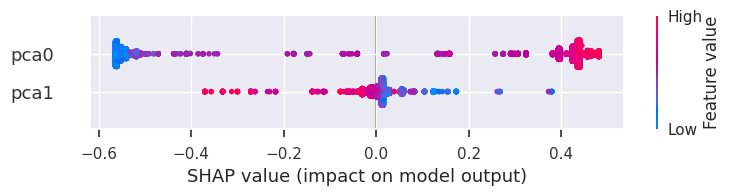

In [133]:
interpret_model(tuned_rf_pca, plot='summary')

In [134]:
interpret_model(tuned_rf_pca, plot='reason', observation=32)

In [ ]:
interpret_model(tuned_rf_pca, plot='reason')